In [1]:
"""Detectron2 heads

ObjectDetection
SemanticSegmentation
InstanceSegmentation
PanopticSegmentation
"""
from detectron2_predictor import Detectron2Predictor
from utilities import create_file_list, imshow_jupyter

data_dir = '/home/tunx404/Miscellaneous/data/' # Local Jupyter

from tqdm import tqdm

In [2]:
map_carla_id_to_trainid = {
    0 : 255, # Unlabeled   
    1 :   2, # Building    
    2 :   4, # Fence       
    3 : 255, # Other       
    4 :  11, # Pedestrian  
    5 :   5, # Pole        
    6 :   0, # RoadLine    
    7 :   0, # Road        
    8 :   1, # SideWalk    
    9 :   8, # Vegetation  
    10:  13, # Vehicles    
    11:   3, # Wall        
    12:   7, # TrafficSign 
    13:  10, # Sky         
    14: 255, # Ground      
    15: 255, # Bridge      
    16: 255, # RailTrack   
    17: 255, # GuardRail   
    18:   6, # TrafficLight
    19: 255, # Static      
    20: 255, # Dynamic     
    21: 255, # Water       
    22:   9  # Terrain     
}

map_cityscapes_id_to_trainid = { 
     0: 255,
     1: 255,
     2: 255,
     3: 255,
     4: 255,
     5: 255,
     6: 255,
     7:   0,
     8:   1,
     9: 255,
    10: 255,
    11:   2,
    12:   3,
    13:   4,
    14: 255,
    15: 255,
    16: 255,
    17:   5,
    18: 255,
    19:   6,
    20:   7,
    21:   8,
    22:   9,
    23:  10,
    24:  11,
    25:  12,
    26:  13,
    27:  14,
    28:  15,
    29: 255,
    30: 255,
    31:  16,
    32:  17,
    33:  18,
    -1: 255
}

map_cityscapes_ignore_in_eval = {
     0: True ,
     1: True ,
     2: True ,
     3: True ,
     4: True ,
     5: True ,
     6: True ,
     7: False,
     8: False,
     9: True ,
    10: True ,
    11: False,
    12: False,
    13: False,
    14: True ,
    15: True ,
    16: True ,
    17: False,
    18: True ,
    19: False,
    20: False,
    21: False,
    22: False,
    23: False,
    24: False,
    25: False,
    26: False,
    27: False,
    28: False,
    29: True ,
    30: True ,
    31: False,
    32: False,
    33: False,
    -1: True ,
}

predictor_classes = (
    'road'         ,
    'sidewalk'     ,
    'building'     ,
    'wall'         ,
    'fence'        ,
    'pole'         ,
    'traffic light',
    'traffic sign' ,
    'vegetation'   ,
    'terrain'      ,
    'sky'          ,
    'person'       ,
    'rider'        ,
    'car'          ,
    'truck'        ,
    'bus'          ,
    'train'        ,
    'motorcycle'   ,
    'bicycle'
)

def encode_labels(mask, map):
    label_mask = np.zeros_like(mask)
    for k in map:
        label_mask[mask == k] = map[k]
    return label_mask

num_predictor_classes = len(predictor_classes)

In [3]:
def intersect_and_union(pred_label, label, num_classes, ignore_index):
    mask = (label != ignore_index)
    pred_label = pred_label[mask]
    label = label[mask]

    intersect = pred_label[pred_label == label]
    area_intersect, _ = np.histogram(
        intersect, bins=np.arange(num_classes + 1))
    area_pred_label, _ = np.histogram(
        pred_label, bins=np.arange(num_classes + 1))
    area_label, _ = np.histogram(label, bins=np.arange(num_classes + 1))
    area_union = area_pred_label + area_label - area_intersect

    return area_intersect, area_union, area_pred_label, area_label

def mean_iou(results, gt_seg_maps, num_classes, ignore_index):
    num_imgs = len(results)
    assert len(gt_seg_maps) == num_imgs
    total_area_intersect = np.zeros((num_classes, ), dtype=np.float)
    total_area_union = np.zeros((num_classes, ), dtype=np.float)
    total_area_pred_label = np.zeros((num_classes, ), dtype=np.float)
    total_area_label = np.zeros((num_classes, ), dtype=np.float)
    for i in range(num_imgs):
        area_intersect, area_union, area_pred_label, area_label = \
            intersect_and_union(results[i], gt_seg_maps[i], num_classes,
                                ignore_index=ignore_index)
        total_area_intersect += area_intersect
        total_area_union += area_union
        total_area_pred_label += area_pred_label
        total_area_label += area_label
    all_acc = total_area_intersect.sum() / total_area_label.sum()
    acc = total_area_intersect / total_area_label
    iou = total_area_intersect / total_area_union

    return all_acc, acc, iou

In [4]:
GOOGLE_COLAB = False

""" Installation

python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# (add --user if you don't have permission)

# Or, to install it from a local clone:
git clone https://github.com/facebookresearch/detectron2.git
python -m pip install -e detectron2
"""
import detectron2

import numpy as np
import os, json, cv2, random
if GOOGLE_COLAB:
    from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

from detectron2.projects.point_rend import add_pointrend_config

import torch
import matplotlib.pyplot as plt

import time
count = 0
class Detectron2Predictor:
    
    default_size = (12, 6)
    
    def __init__(self, head='InstanceSegmentation'):
        self.cfg = get_cfg()

        self.head = head

        # Model Zoo
        # https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md

        if self.head == 'ObjectDetection':
            config_file = 'COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml' # 1531 MiB
            config_path = model_zoo.get_config_file(config_file)
            model_path  = model_zoo.get_checkpoint_url(config_file)

        elif self.head == 'SemanticSegmentation':
            # # Poor performance
            # config_path = 'configs/Misc/semantic_R_50_FPN_1x.yaml'
            # model_path = 'https://dl.fbaipublicfiles.com/detectron2/ImageNetPretrained/MSRA/R-50.pkl'
            
            # PointRend
            # https://github.com/facebookresearch/detectron2/tree/main/projects/PointRend
            add_pointrend_config(self.cfg)
            config_path = 'configs/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes.yaml'
            model_path  = 'detectron2://PointRend/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes/202576688/model_final_cf6ac1.pkl'
        
        elif self.head == 'InstanceSegmentation':
            config_file = 'COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml' # 1539 MiB
            config_path = model_zoo.get_config_file(config_file)
            model_path  = model_zoo.get_checkpoint_url(config_file)

        elif self.head == 'PanopticSegmentation':
            config_file = 'COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml' # 720: 1945 MiB # 360: 1755 MiB
            # config_file = 'COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml' # 2019 MiB
            config_path = model_zoo.get_config_file(config_file)
            model_path  = model_zoo.get_checkpoint_url(config_file)

        # print(config_path)
        # print(model_path)

        self.cfg.merge_from_file(config_path)
        self.cfg.MODEL.WEIGHTS = model_path

        self.cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
        self.cfg.MODEL.DEVICE = 'cuda'

        self.predictor = DefaultPredictor(self.cfg)

    def test_image(self, image, show_original=False, size=None):
        if size is None:
            size = self.default_size
            
        # print(image.shape)
        
        if show_original:
            if GOOGLE_COLAB:
                cv2_imshow(image)
            else:
                imshow_jupyter(image, type='BGR', size=size)

        v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]))

        start_time = time.time()
        outputs = self.predictor(image)
        print(f'Time = {time.time() - start_time}')
        
        if self.head == 'SemanticSegmentation':
            sem_seg = torch.argmax(outputs['sem_seg'], dim=0)
            # print(outputs['sem_seg'].shape)
            # print(sem_seg.shape)
            # print(sem_seg)
            output = v.draw_sem_seg(sem_seg.to('cpu'))
        elif self.head == 'PanopticSegmentation':
            panoptic_seg, segments_info = outputs['panoptic_seg']
            # print(outputs['panoptic_seg'])
            # print(panoptic_seg)
            # print(segments_info)
            output = v.draw_panoptic_seg_predictions(panoptic_seg.to('cpu'), segments_info)
        else:
            # print(outputs['instances'])
            # print(outputs['instances'].pred_classes)
            # print(outputs['instances'].pred_boxes)
            output = v.draw_instance_predictions(outputs['instances'].to('cpu'))
            
        if GOOGLE_COLAB:
            cv2_imshow(out.get_image()[:, :, ::-1])
        else:
            predicted_image = cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
            imshow_jupyter(predicted_image, size=size)

    def test_image_file(self, image_path, show_original=False, size=None):
        if size is None:
            size = self.default_size
        image = cv2.imread(image_path)
        self.test_image(image, show_original, size)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # self.test_image(image, show_original, size)
            
    def test_sem_seg(self, image, size=None):
        if size is None:
            size = self.default_size
        
        global count
            
        assert self.head == 'SemanticSegmentation'
        
        outputs = self.predictor(image)
        
        count += 1
        cv2.imwrite(str(count) + '.png', image)
        
        sem_seg = torch.argmax(outputs['sem_seg'], dim=0)
        
        v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]))
        output = v.draw_sem_seg(sem_seg.to('cpu'))
        
        count += 1
        cv2.imwrite(str(count) + '.png', output.get_image()[:, :, ::-1])
        
        predicted_image = cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
        imshow_jupyter(predicted_image, size=size)
        
        return sem_seg.to('cpu').numpy()

    def test_image_file_cityscapes(self, image_path, size=None):
        if size is None:
            size = self.default_size
        image = cv2.imread(image_path)
        sem_seg = self.test_sem_seg(image, size)
        
        anno_path = get_sem_seg_path(image_path)
        anno_sem_seg = cv2.imread(anno_path)[:, :, 0] # 3 channels are the same
        anno_sem_seg = encode_labels(anno_sem_seg, map=map_cityscapes_id_to_trainid)
        
        # print(sem_seg.shape)
        # print(sem_seg)
        # imshow_jupyter(sem_seg, size=size)
        
        # print(anno_sem_seg.shape)
        # print(anno_sem_seg)
        # imshow_jupyter(anno_sem_seg, size=size)
        
        global num_predictor_classes
        all_acc, acc, iou = mean_iou(anno_sem_seg, sem_seg, num_classes=num_predictor_classes, ignore_index=255)
        
        return np.array(iou), np.array(acc), all_acc

    def test_image_file_carla(self, image_path, anno_path, size=None):
        if size is None:
            size = self.default_size
        image = cv2.imread(image_path)
        sem_seg = self.test_sem_seg(image, size)
        
        anno_sem_seg = cv2.imread(anno_path)[:, :, 0] # 3 channels are the same
        anno_sem_seg = encode_labels(anno_sem_seg, map=map_carla_id_to_trainid)
        
        # print(sem_seg.shape)
        # print(sem_seg)
        # imshow_jupyter(sem_seg, size=size)
        
        # print(anno_sem_seg.shape)
        # print(anno_sem_seg)
        # imshow_jupyter(anno_sem_seg, size=size)
        
        global num_predictor_classes
        all_acc, acc, iou = mean_iou(anno_sem_seg, sem_seg, num_classes=num_predictor_classes, ignore_index=255)
        
        return np.array(iou), np.array(acc), all_acc

    def test_video_file(self, video_path):
        cap = cv2.VideoCapture(video_path)

        if cap.isOpened() == False:
            print('Video opening error!')
            return
        
        (success, image) = cap.read()
        while success:
            self.test_image(image)

            key = cv2.waitKey(1) & 0xFF
            if key == ord('q'):
                break
                
            (success, image) = cap.read()
            
def print_summary(iou, acc, all_acc):
    global num_predictor_classes
    num_classes = num_predictor_classes
    class_names = predictor_classes
    
    # iou[iou == 0] = np.nan
    # acc[acc == 0] = np.nan
    
    summary_str = ''
    summary_str += 'per class results:\n'

    line_format = '{:<15} {:>10} {:>10}\n'
    summary_str += line_format.format('Class', 'IoU', 'Acc')
    for i in range(num_classes):
        iou_str = '{:.2f}'.format(iou[i] * 100)
        acc_str = '{:.2f}'.format(acc[i] * 100)
        summary_str += line_format.format(class_names[i], iou_str, acc_str)
    summary_str += 'Summary:\n'
    line_format = '{:<15} {:>10} {:>10} {:>10}\n'
    summary_str += line_format.format('Scope', 'mIoU', 'mAcc', 'aAcc')

    iou_str = '{:.2f}'.format(np.nanmean(iou) * 100)
    acc_str = '{:.2f}'.format(np.nanmean(acc) * 100)
    all_acc_str = '{:.2f}'.format(all_acc * 100)
    summary_str += line_format.format('global', iou_str, acc_str, all_acc_str)

    print(summary_str)

Number of images: 171


The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  0%|                                                                                                                                                                  | 0/10 [00:00<?, ?it/s]

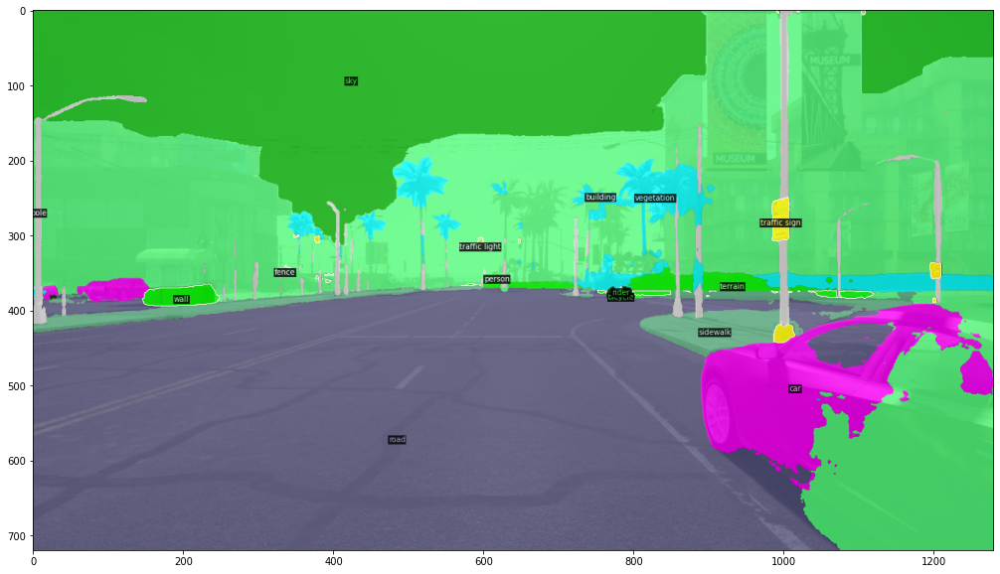

 10%|███████████████▍                                                                                                                                          | 1/10 [00:03<00:29,  3.27s/it]

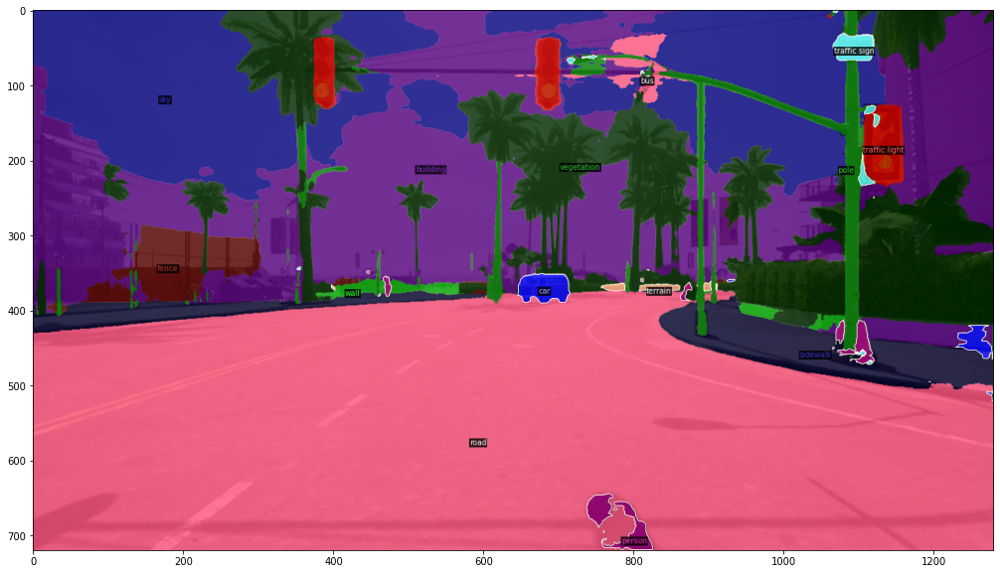

 20%|██████████████████████████████▊                                                                                                                           | 2/10 [00:06<00:25,  3.18s/it]

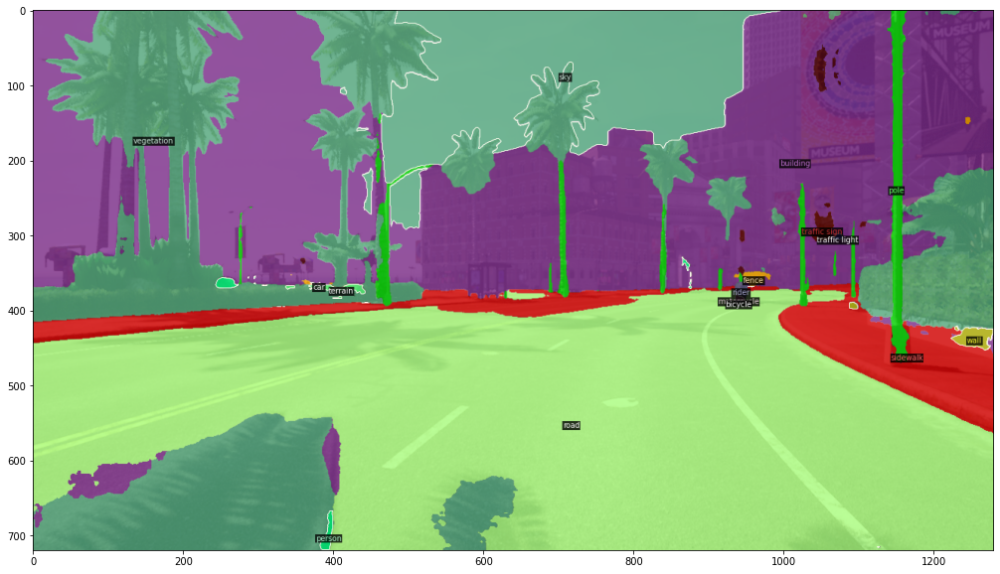

 30%|██████████████████████████████████████████████▏                                                                                                           | 3/10 [00:09<00:21,  3.08s/it]

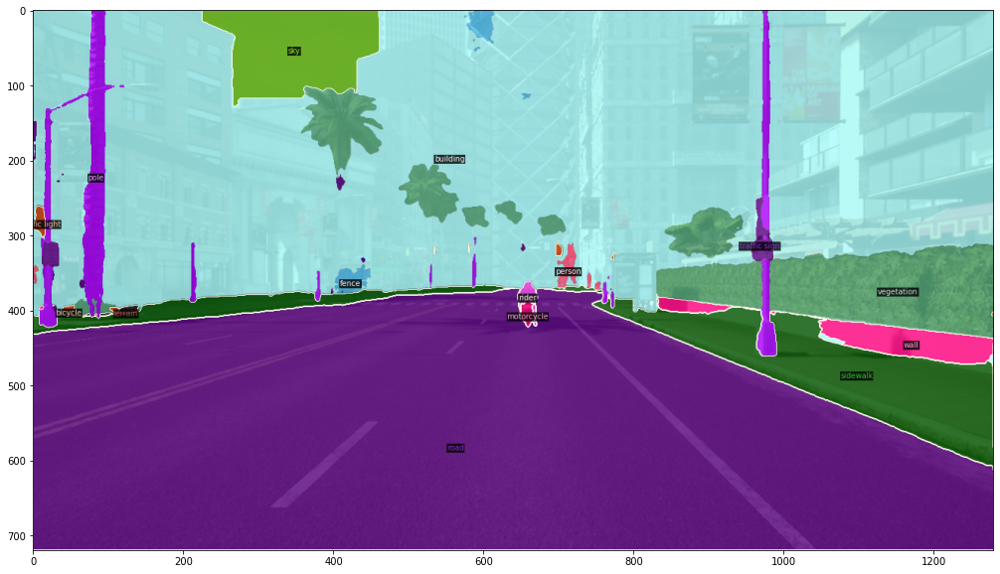

 40%|█████████████████████████████████████████████████████████████▌                                                                                            | 4/10 [00:12<00:17,  2.93s/it]

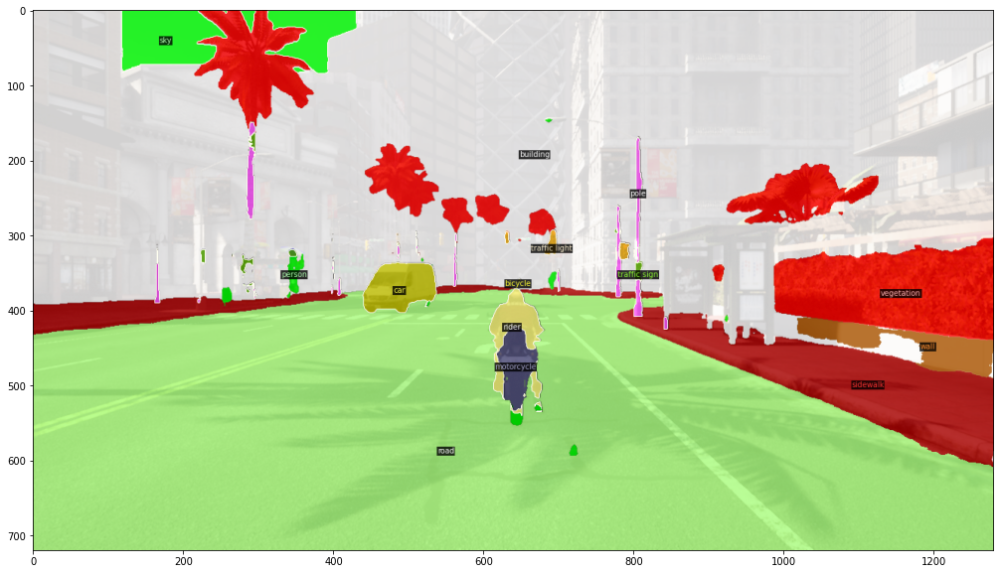

 50%|█████████████████████████████████████████████████████████████████████████████                                                                             | 5/10 [00:14<00:14,  2.90s/it]

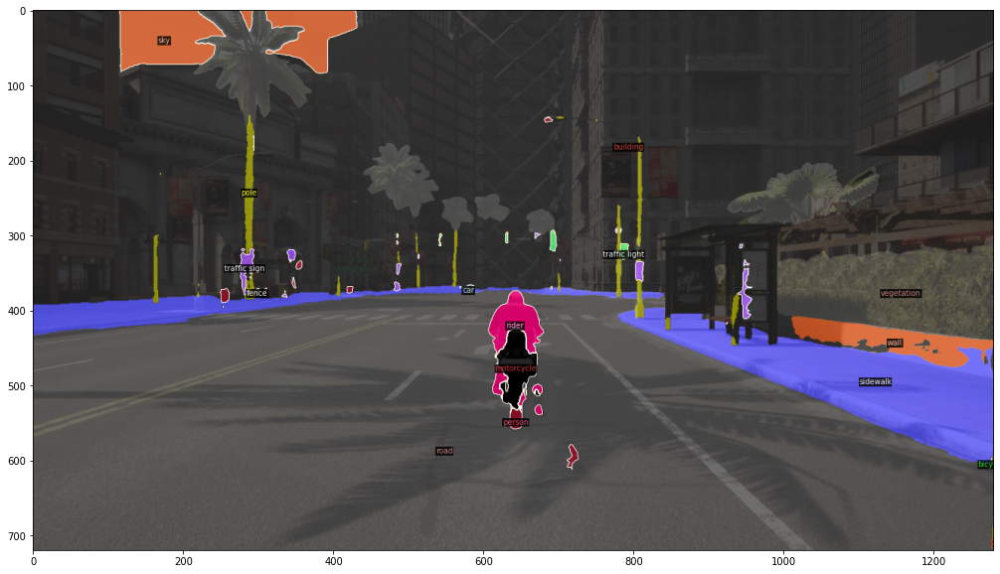

 60%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 6/10 [00:17<00:11,  2.84s/it]

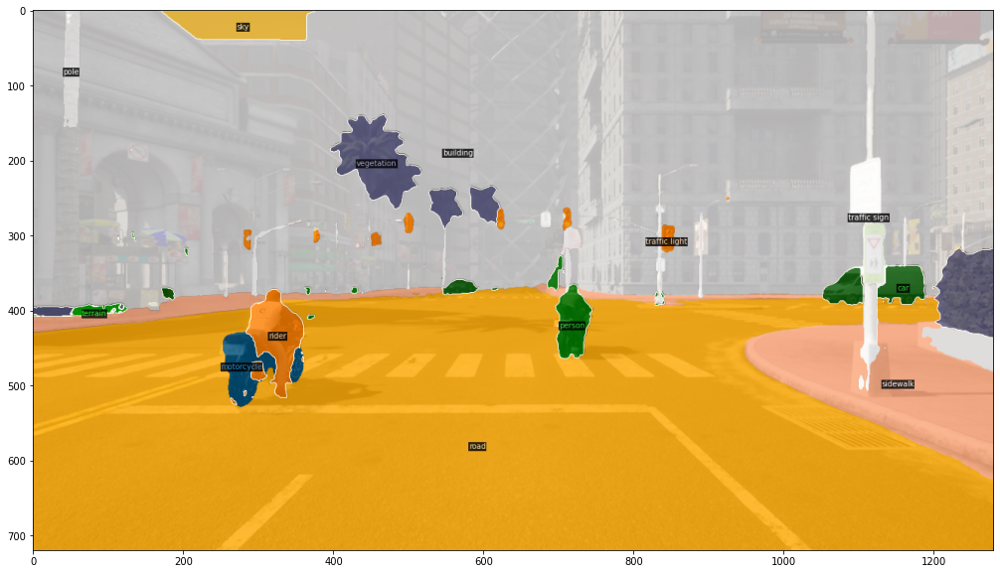

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 7/10 [00:20<00:08,  2.84s/it]

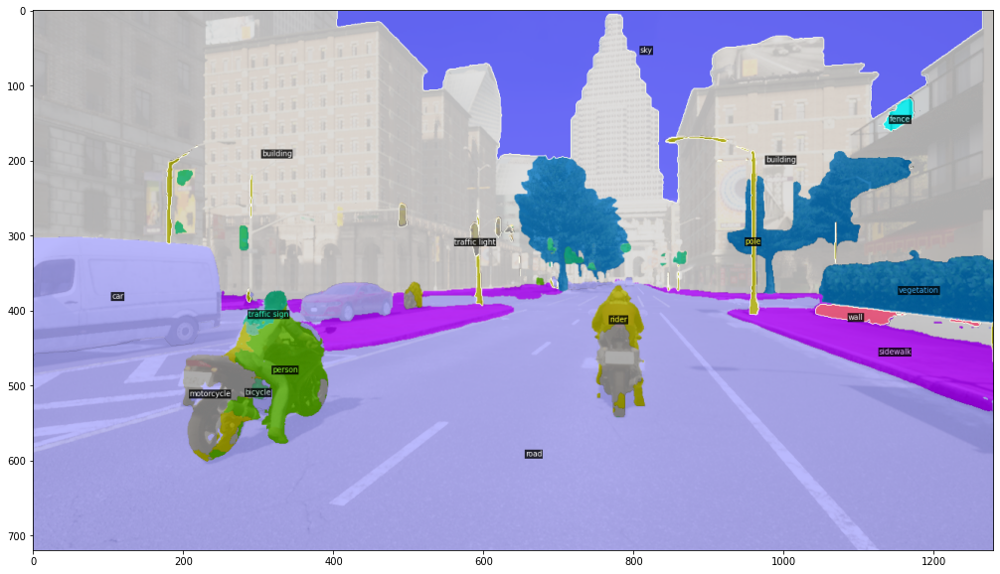

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 8/10 [00:23<00:06,  3.01s/it]

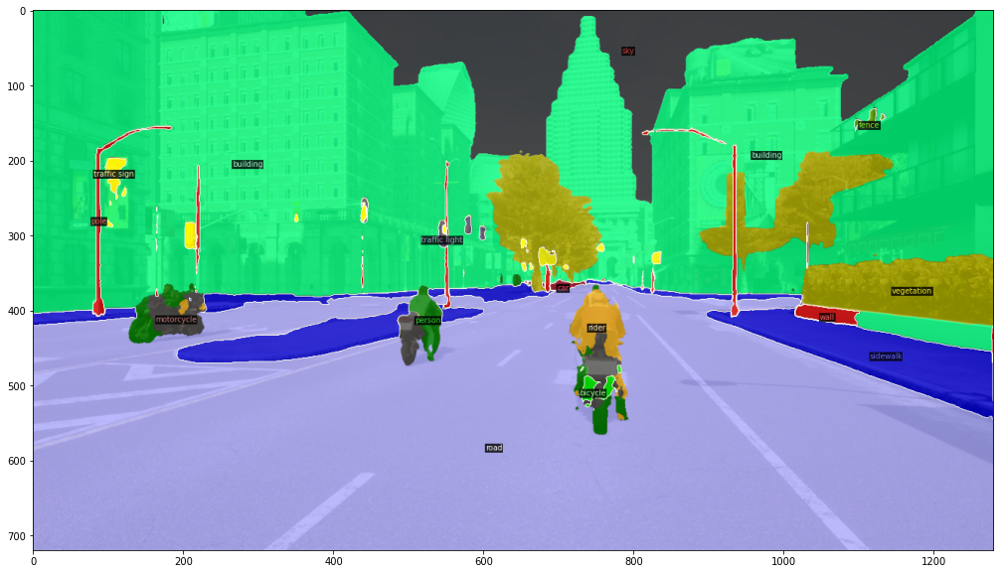

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 9/10 [00:26<00:02,  2.96s/it]

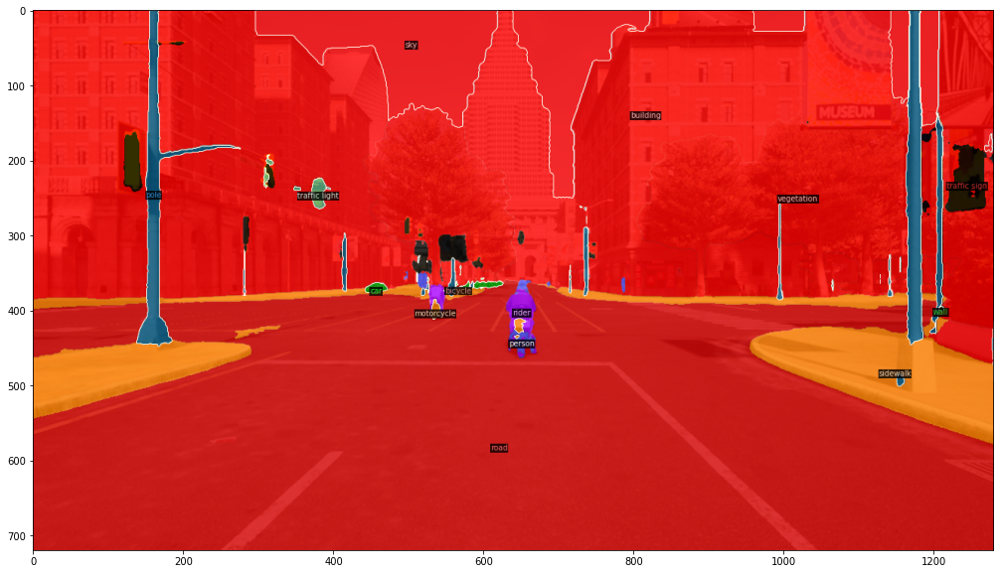

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:29<00:00,  2.95s/it]

per class results:
Class                  IoU        Acc
road                  5.54       5.69
sidewalk              3.86       4.75
building              3.99       4.13
wall                  0.00       0.00
fence                 0.14       0.41
pole                  1.95       3.18
traffic light         1.65       3.17
traffic sign          1.30       1.91
vegetation            3.79       4.53
terrain               0.00       0.00
sky                   4.73       5.82
person                0.43       0.73
rider                 0.00       0.00
car                   1.37       3.17
truck                 0.00       0.00
bus                   0.00       0.00
train                 0.00       0.00
motorcycle            0.00       0.00
bicycle               0.00       0.00
Summary:
Scope                 mIoU       mAcc       aAcc
global                1.51       1.97       4.91



In [5]:
data_carla_dir = data_dir + 'Carla/'

# Dir structure:
# <data_carla_dir>
#     packages2
#     packages3
#     ...

def get_carla_file_list(data_dir, packages=[], levels=[]):
    file_list = []
    
    for package in packages:
        temp_file_name_list, temp_file_path_list = create_file_list(data_dir, package)
        
        for i in range(len(temp_file_name_list)):
            file_name_split = temp_file_name_list[i].split('_')
            if len(file_name_split) == 3: # [id, type, level.png]
                file_id = file_name_split[0]
                level = file_name_split[2].replace('.png', '')
                if level in levels:
                    file_list.append((file_id, level, package))
                    
    print(f'Number of images: {len(file_list)}')
    
    return file_list

data_carla_file_list = get_carla_file_list(data_carla_dir, packages=['package4'], levels=['H', 'M', 'S'])

def get_carla_file_path_list(file_list, data_dir):
    image_path_list = []
    anno_path_list = []
    
    for file in file_list:
        file_id, level, package = file

        image_clear_path = os.path.join(data_dir, package, file_id + '_clear.png')
        image_rain_path = os.path.join(data_dir, package, file_id + '_rain_' + level + '.png')
        image_semantic_path = os.path.join(data_dir, package, file_id + '_semantic_single.png')

        image_path_list.append(image_clear_path)
        anno_path_list.append(image_semantic_path)

    return image_path_list, anno_path_list

carla_image_path_list, carla_anno_path_list = get_carla_file_path_list(data_carla_file_list, data_carla_dir)
# print(carla_image_path_list[:2])
# print(carla_anno_path_list[:2])

predictor = Detectron2Predictor(head='SemanticSegmentation')

num_images = len(carla_image_path_list)

mIoU, mAcc, aAcc = np.zeros(num_predictor_classes), np.zeros(num_predictor_classes), 0
for i in tqdm(range(10)):
    IoU, Acc, all_acc = predictor.test_image_file_carla(carla_image_path_list[i], carla_anno_path_list[i], size=(20,10))
    mIoU = np.nansum(np.stack((mIoU, IoU)), axis=0)
    mAcc = np.nansum(np.stack((mAcc, Acc)), axis=0)
    aAcc += all_acc

print_summary(mIoU/num_images, mAcc/num_images, aAcc/num_images)

Number of images: 154


The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  0%|                                                                                                                                                                  | 0/10 [00:00<?, ?it/s]

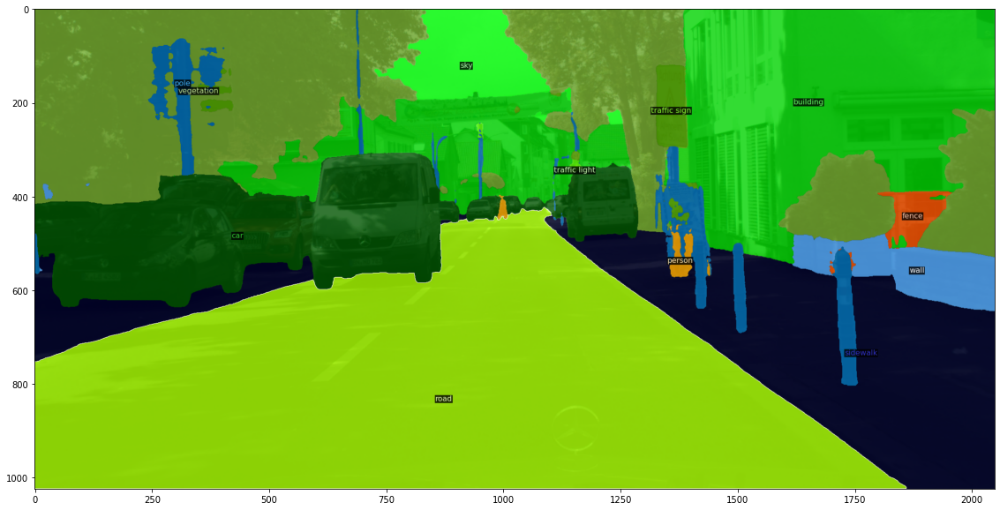

 10%|███████████████▍                                                                                                                                          | 1/10 [00:05<00:53,  5.94s/it]

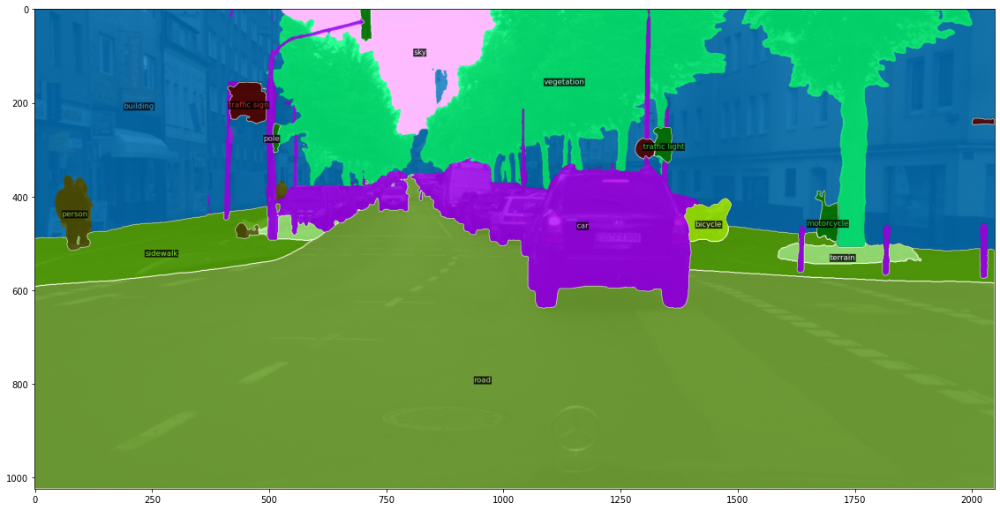

 20%|██████████████████████████████▊                                                                                                                           | 2/10 [00:10<00:40,  5.01s/it]

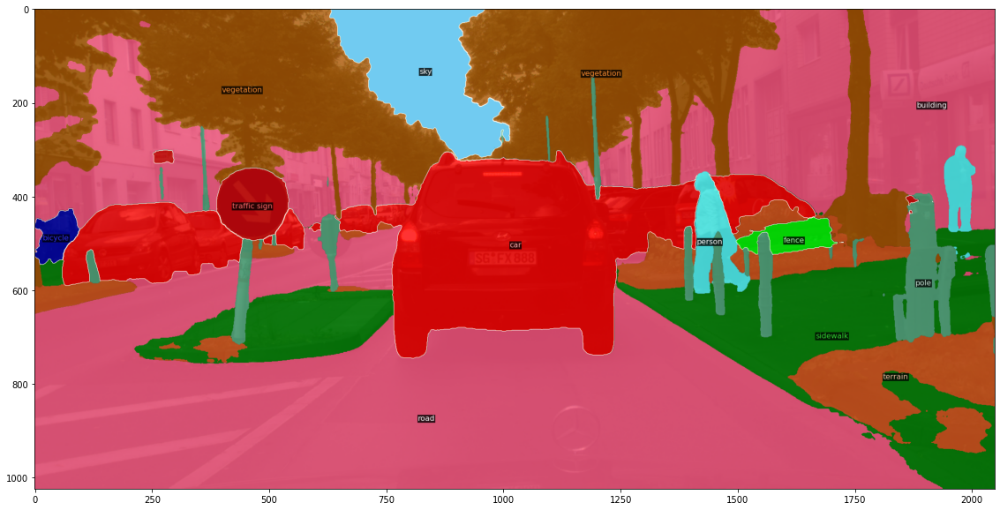

 30%|██████████████████████████████████████████████▏                                                                                                           | 3/10 [00:15<00:35,  5.14s/it]

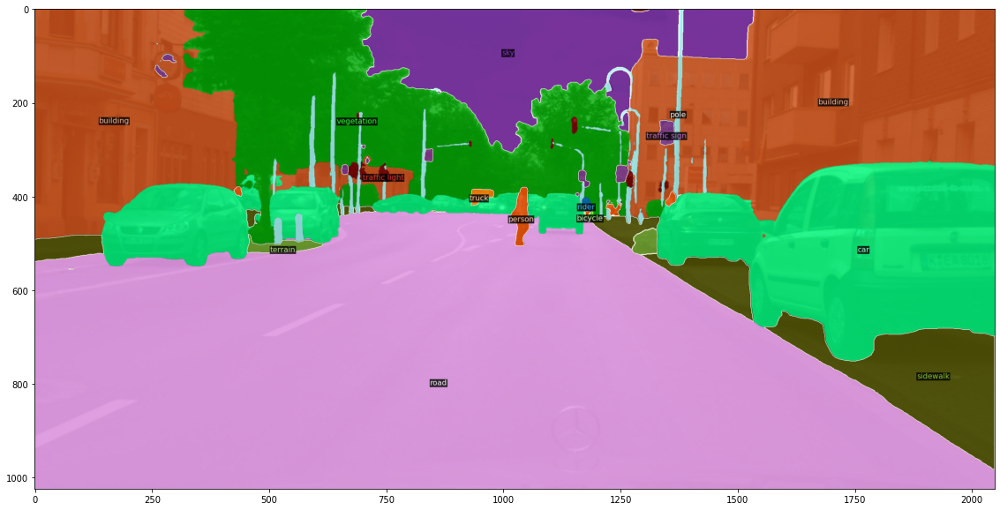

 40%|█████████████████████████████████████████████████████████████▌                                                                                            | 4/10 [00:20<00:30,  5.03s/it]

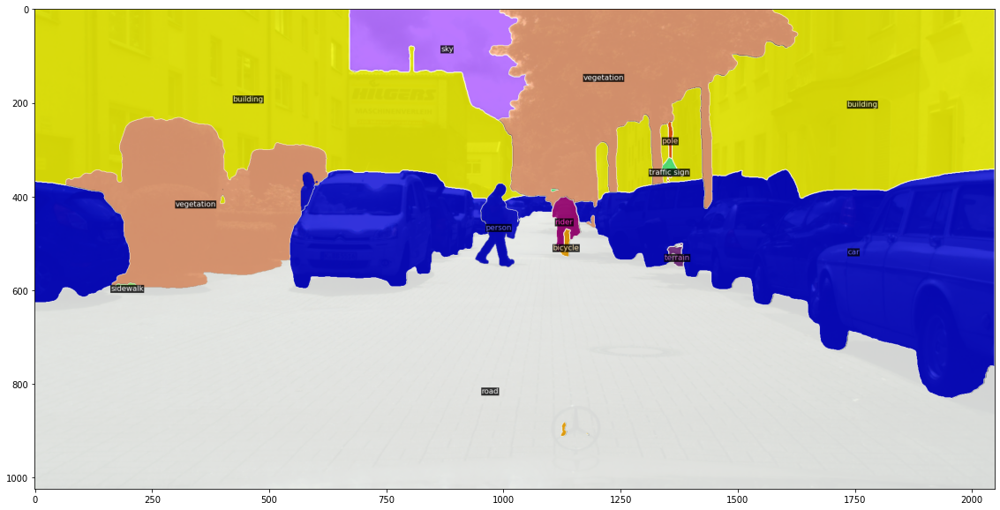

 50%|█████████████████████████████████████████████████████████████████████████████                                                                             | 5/10 [00:23<00:21,  4.37s/it]

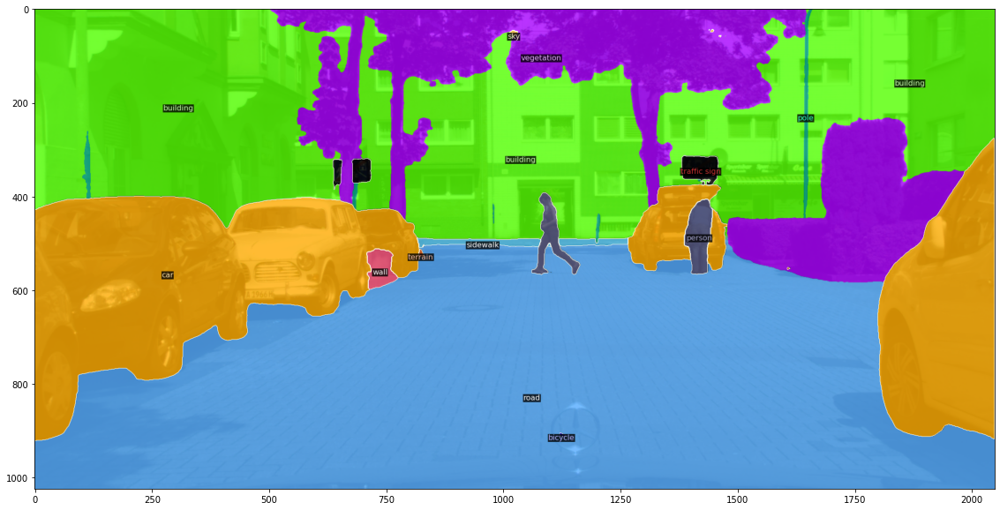

 60%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 6/10 [00:27<00:16,  4.11s/it]

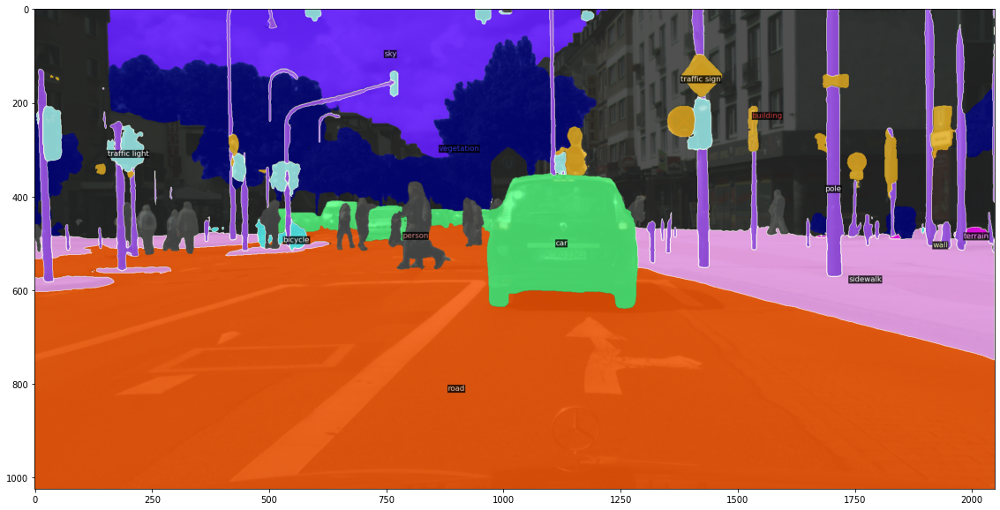

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 7/10 [00:31<00:12,  4.28s/it]

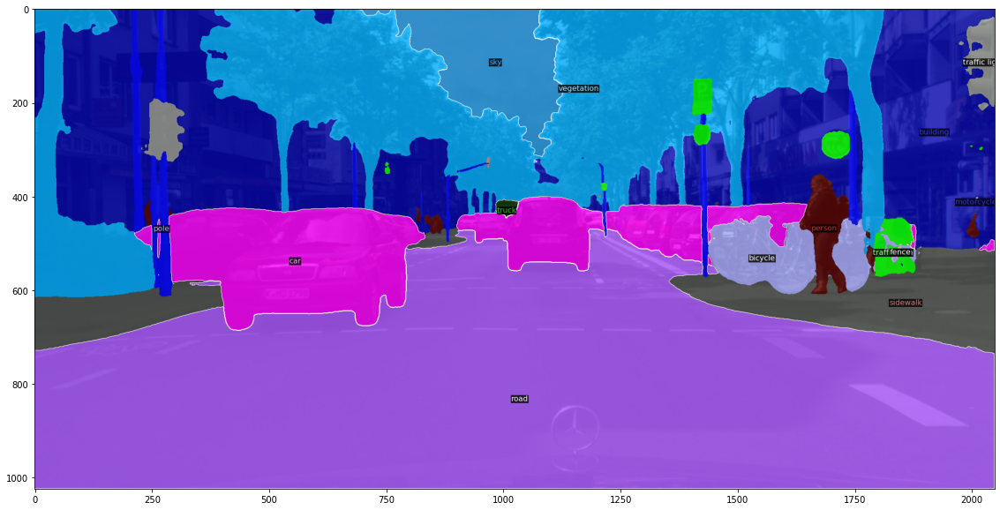

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 8/10 [00:37<00:09,  4.64s/it]

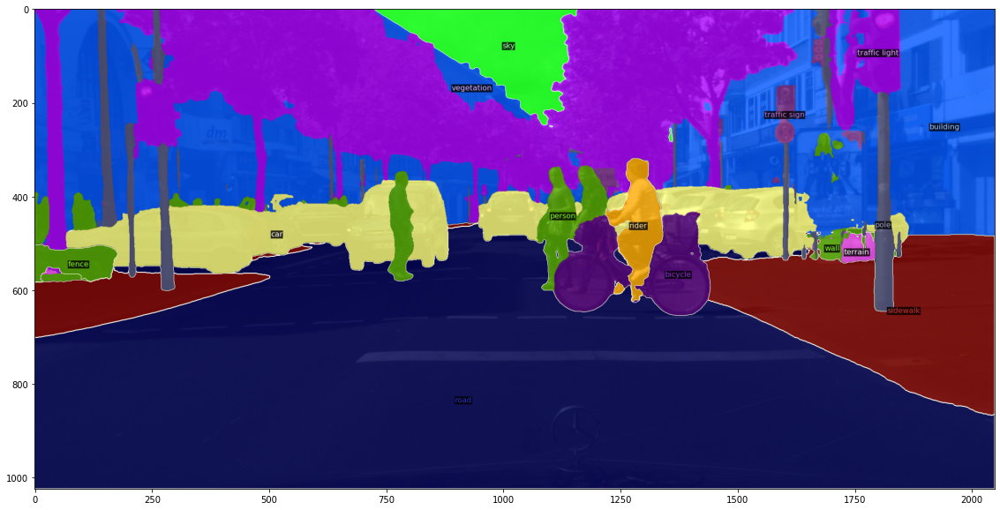

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 9/10 [00:43<00:05,  5.04s/it]

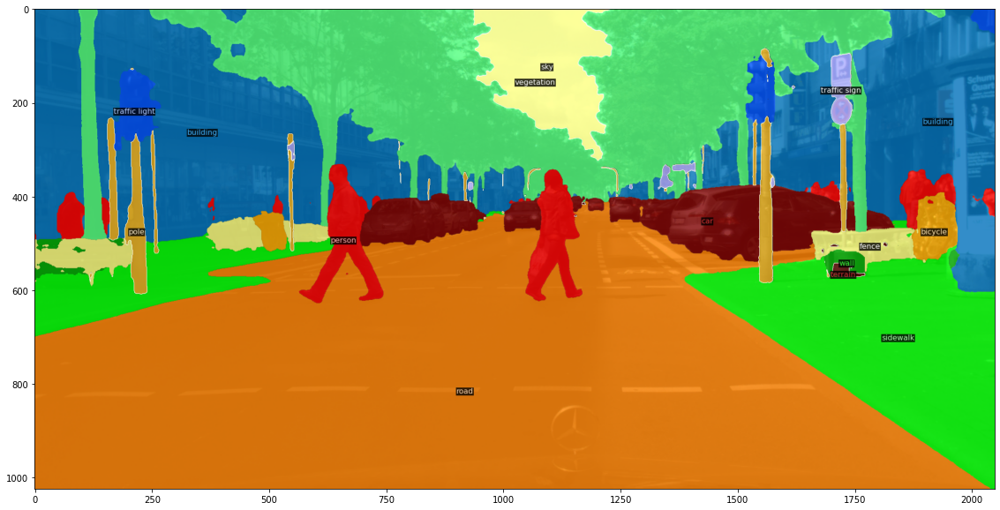

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:49<00:00,  4.97s/it]

per class results:
Class                  IoU        Acc
road                  5.60       5.61
sidewalk              4.49       4.76
building              5.40       5.49
wall                  0.55       0.60
fence                 1.05       1.26
pole                  3.18       3.96
traffic light         2.96       3.95
traffic sign          3.67       4.01
vegetation            5.75       6.06
terrain               2.06       2.90
sky                   5.27       5.37
person                4.42       5.25
rider                 1.02       1.21
car                   6.02       6.22
truck                 0.98       1.17
bus                   0.00       0.00
train                 0.00       0.00
motorcycle            0.49       0.61
bicycle               3.03       3.41
Summary:
Scope                 mIoU       mAcc       aAcc
global                2.94       3.25       5.69



In [6]:
import os
from tkinter import Tcl
def create_file_list(dir, sub_dir=''):
    file_name_list = os.listdir(os.path.join(dir, sub_dir))
    file_name_list = list(Tcl().call('lsort', '-dict', file_name_list)) # Sort by filename
    file_path_list = file_name_list.copy()
    for i in range(len(file_path_list)):
        file_path_list[i] = os.path.join(dir, sub_dir, file_name_list[i])
    return file_name_list, file_path_list

data_dir_cityscapes = data_dir + 'Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/train/cologne/'
anno_dir_cityscapes = data_dir + 'Cityscapes/gtFine_trainvaltest/gtFine/train/cologne/'

cityscapes_file_name_list, cityscapes_file_path_list = create_file_list(data_dir_cityscapes)

                    
print(f'Number of images: {len(cityscapes_file_name_list)}')

# print(cityscapes_file_name_list[:2])
# print(cityscapes_file_path_list[:2])

def get_sem_seg_path(image_path):
    image_name = os.path.basename(image_path)
    image_name_split = image_name.split('_')
    anno_name = image_name_split[0] + '_' + image_name_split[1] + '_' + image_name_split[2] + '_gtFine_labelIds.png'
    
    image_path_split = image_path.split('/')
    dir = os.path.dirname(image_path)
    anno_path = os.path.join(dir, '../../../../gtFine_trainvaltest/gtFine/', # gtFine
                             image_path_split[-3], # train/val/test
                             image_path_split[-2], # city
                             anno_name) # ..._gtFine_labelIds.png
    return anno_path

predictor = Detectron2Predictor(head='SemanticSegmentation')

num_images = len(cityscapes_file_name_list)

mIoU, mAcc, aAcc = np.zeros(num_predictor_classes), np.zeros(num_predictor_classes), 0
for i in tqdm(range(10)):
    IoU, Acc, all_acc = predictor.test_image_file_cityscapes(cityscapes_file_path_list[i], size=(20, 10))
    mIoU = np.nansum(np.stack((mIoU, IoU)), axis=0)
    mAcc = np.nansum(np.stack((mAcc, Acc)), axis=0)
    aAcc += all_acc

print_summary(mIoU/num_images, mAcc/num_images, aAcc/num_images)